# Import

In [1]:
# from matplotlib import pyplot as plt
import matplotlib.ticker as plticker
from pyzbar import pyzbar
import cv2
import pytesseract
from PIL import Image
import os
import numpy as np
import pandas as pd
import imutils
import pdf2image
from dbr import DynamsoftBarcodeReader
import re
from matplotlib import pyplot as plt
from skimage.measure import compare_ssim
import imutils
import statistics
from scipy import stats
import random
from difflib import SequenceMatcher
from IPython.display import display, Markdown, Latex
%matplotlib inline

# FILES

In [2]:
os.chdir('/Users/kunal/Documents/VdartWorking/realFake/')

## TESTING IMAGE

In [3]:
MAINIMAGEFILEPNG = '/Users/kunal/Documents/VdartWorking/SampleCopies/FakeCopies/25NOV2019/Nageswara_H1BPNG.PNG'
MAINIMAGEFILEJPG = MAINIMAGEFILEPNG
MAINPDFFILE = '/Users/kunal/Documents/VdartWorking/SampleCopies/FakeCopies/25NOV2019/Nageswara_H1B.pdf'

In [4]:
IMAGE1NAME = MAINIMAGEFILEPNG
img1 = cv2.imread(IMAGE1NAME)
x11, y11, z11 = img1.shape
img1 = cv2.resize(img1, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)

## REAL Image

In [5]:
COMPAREIMAGEFILEPNG = '/Users/kunal/Documents/VdartWorking/realFake/Document.jpg'
#COMPAREFILEPDF = '/Users/kunal/Documents/VdartWorking/SampleCopies/GenuineCopies/H1B-Anil Gade.pdf'

In [6]:
#REAL IMAGE
IMAGE2NAME = COMPAREIMAGEFILEPNG
img2 = cv2.imread(IMAGE2NAME) 
x2, y2, z2 = img2.shape
img2 = cv2.resize(img2, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)

# Display the Image

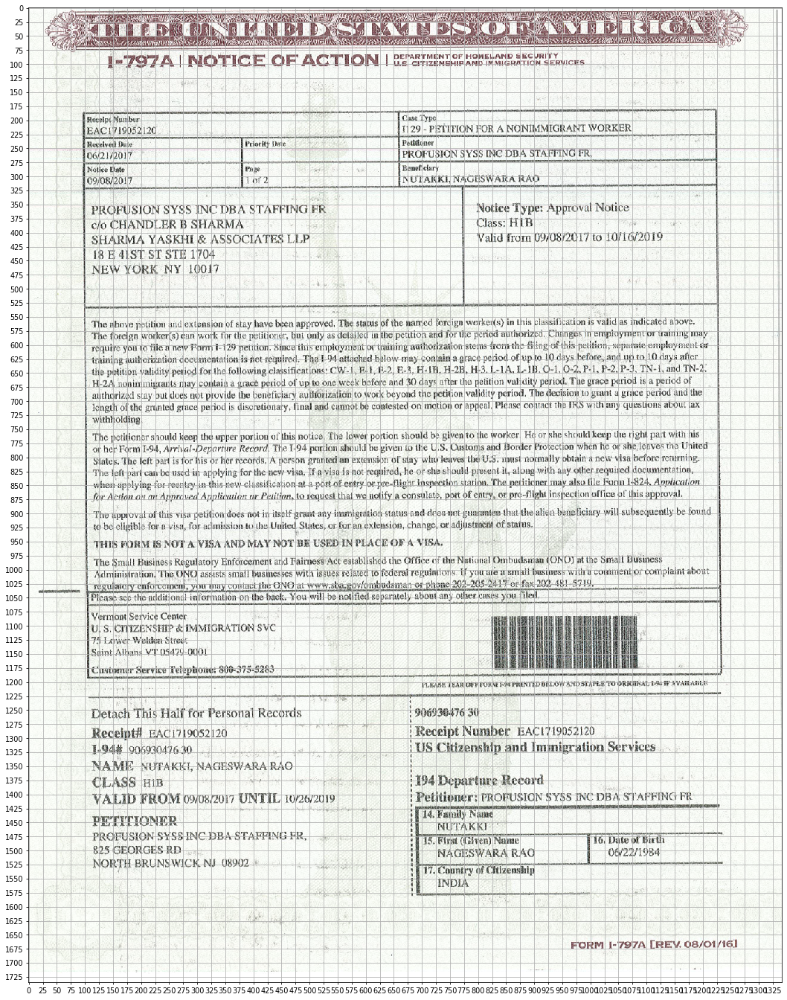

In [7]:
file = MAINIMAGEFILEPNG
image = Image.open(file)
imageCV = cv2.imread(file)
my_dpi=70. # size of the axis (the text size)
fig=plt.figure(figsize=(float(image.size[0])/my_dpi,float(image.size[1])/my_dpi),dpi=my_dpi)
ax=fig.add_subplot(111)
myxInterval=25. #the interval for the X axis
myyInterval=25. #the interval for the Y axis
locx = plticker.MultipleLocator(base=myxInterval)
locy = plticker.MultipleLocator(base=myyInterval)
ax.xaxis.set_major_locator(locx)
ax.yaxis.set_major_locator(locy)
# Add the grid
ax.grid(which='major', axis='both', linestyle='-')

# Add the image
ax.imshow(image)
# Save the figure
fig.savefig('myImageGrid.png',dpi=my_dpi)

# Barcode

In [8]:
def checkEqual1(iterator):
    iterator = iter(iterator)
    try:
        first = next(iterator)
    except StopIteration:
        return True
    return all(first == rest for rest in iterator)

In [9]:
def getText(result, partText):
    endindex = result + 80
    partialdetected = text[result:endindex]
    endindex = partialdetected.find("\n")
    fulldetected = partialdetected[:endindex]
    startindex = fulldetected.find(partText)#'er'
    barcodeNumberdetectedname = fulldetected[startindex+3:28]
    return barcodeNumberdetectedname

## Detection

In [10]:
#t0068MgAAACk+RNudXWjI8IqSZ6cPB04DUpOUhqTHb7YTFYTgM+nuTsx92c7RDeCS6o417Oo6MKjRUn0LnCMqfxz8JHqN74w=

In [11]:
barcodeArray = []
dbr = DynamsoftBarcodeReader()
dbr.initLicense('t0068MgAAACk+RNudXWjI8IqSZ6cPB04DUpOUhqTHb7YTFYTgM+nuTsx92c7RDeCS6o417Oo6MKjRUn0LnCMqfxz8JHqN74w=') # https://www.dynamsoft.com/CustomerPortal/Portal/Triallicense.aspx
results = dbr.DecodeFile(MAINPDFFILE)
textResults = results["TextResults"]
for textResult in textResults:
    print(textResult["BarcodeText"])
    barcodeArray.append(textResult["BarcodeText"])

EAC1719052120


In [12]:
if len(barcodeArray) == 0:
    print("NO BARCODE DETECTED!!!!")
    barcodeDetected = "N/A"
elif len(barcodeArray) == 1:
    barcodeDetected = barcodeArray[0]
elif len(barcodeArray) > 1:
    working = checkEqual1(barcodeArray)
    if working:
        barcodeDetected = barcodeArray[0]
    else:
        barcodeDetected = "N/A"

## Tesseract Compare

In [13]:
thing = MAINIMAGEFILEJPG 

In [14]:
OCRPIC = thing
value=Image.open(OCRPIC)
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files (x86)\Tesseract-OCR\tesseract.exe"
text = pytesseract.image_to_string(value, config='')

In [15]:
print(text)

Recelp{ Number
EAC1719052120

 

Received Date Priority Date

06/21/2017

Notice Date Page : Ei
09/08/2017, Lof2

 
   
     

PROFUSION SYSS INC DBA STAFFING FR.
c/o CHANDLER B SHARMA

SHARMA YASKHI & ASSOCIATES LLP

18 E 41ST ST STE 1704
NEW YORK NY 10017

   
 
 
 

withholding.

   
 
 
 
 
 
 
  

 
    

     

Please see the addition:

    

  

Vermont Service Center

U, S. CITIZENSHIP & IMMIGRATION SVC
75 Lower Welden Street

Saint Albans VT 05479-0001

Customer Service Telephone: 800-375-5283

    

 

 

 

Detach This Half for Personal Records
Receipt# EAC1719052120 ;
1-94 906930476 30 ‘ S49
NAME NUTAKKI, NAGESWARA RAO
CLASS HIB ad :
VALID FROM 09/08/2017 UNTIL 10/26/2019

PETITIONER

PROFUSION SYSS INC DBA STAFFING FR,
825 GEORGES RD

NORTH BRUNSWICK NJ_ 08902 +

DEPARTMENT OF HOMELAND SECURITY
U.S, CITIZENSHIP AND IMMIGRATION SERVICES

  
   
 

MCT SS

 
 
  

Case Type
1129 - PETITION FOR A NONIMMIGRANT WORKER

Petitioner "
PROFUSION SYSS.INC DBA STAFFING FR,

Beneficia

In [16]:
result = text.find('Receipt#') 
result2pt1  = text.find('Receipt Number ')
textpt1 = text[result2pt1:len(text)]
#print(textpt1)
result2 = textpt1.find('Receipt Number ')
#print(result2)
result1Final = getText(result,'pt')
result2Final = getText(result2, 'er')
#print(result2)
#text[result2:result2+50]
if result1Final.endswith(";"):
    result1Final= result1Final.substring(0, result1Final.length() - 1);
if result2Final.endswith(";"):
    result2Final= result2Final.substring(0, result2Final.length() - 1);
result1Final = result1Final.strip()
result2Final = result2Final.strip()
print(result1Final, result2Final)

EAC1719052120 ; 


In [17]:
samevalue = False
if result1Final != result2Final:
    if len(result1Final) == len(result2Final):
        difference = []
        for i in range(len(result1Final)):
            if result1Final[i] != result2Final[i]:
                difference.append(i)
        if len(difference) == 1:
            differencePoint = difference[0]
        else:
            print("Multiple Differences")
        if (((result1Final[differencePoint] == '1') or (result2Final[differencePoint] == 'I')) or((result1Final[differencePoint] == 'I') or (result1Final[differencePoint] == '1'))):
            print("Error between '1' and 'I' at position 1")
            print(result1Final)
            print(result2Final)
        else:
            print("I DONT KNOW")
    elif(len(result1Final) < 3):
        result1Final = result2Final
        print("First one had an error")
    elif(len(result2Final) < 3):
        result2Final = result1Final
        print("Second one had an error")
    else:
        print("There is a difference in length -- ERROR")
else:
    print("The Output is the same")
    samevalue = True

Second one had an error


In [18]:
equal = False
if samevalue:
    print("The barcode decoded is", barcodeDetected)
    print("The text for barcode detected is", result1Final)
    if (result1Final == barcodeDetected):
        print("EQUAL")
    else:
        print("NOT EQUAL")
else:
    print("The barcode decoded is", barcodeDetected)
    print("The text for barcode detected is", result1Final, " and ", result2Final)
    if (result1Final == barcodeDetected):
        print("EQUAL -- First one is correct")
        equal = True
    if (result2Final == barcodeDetected):
        print("EQUAL -- Second is correct")
        equal = True
    if not equal:
        if (result1Final != barcodeDetected) or (result2Final != barcodeDetected):
            print("NOT EQUAL")

The barcode decoded is EAC1719052120
The text for barcode detected is EAC1719052120 ;  and  EAC1719052120 ;
NOT EQUAL


In [19]:
BARCODEISCORRECT = equal

# DATE DETECTION

In [20]:
result = text.find('Valid from') 
big = text[result:result+35]

In [21]:
start = big.find("from")
startstr = big[start+5:start+15]
end = big.find("to")
endstr = big[end+3:end+13]

In [22]:
start = startstr.split("/")
end = endstr.split("/")

In [23]:
work = False
reason = ""
if ((len(start) == 3) and (len(end) == 3)):    
    if(start[2] > end[2]):
        work = False
        reason = "Year is before the starting one"
    if(start[2] == end[2]):
        if(end[0] < start[0]):
            work = False
            reason = "Month Doesn't Work"
        if(end[0] > start[0]):
            work = True
            reason = "Month Works"
        if(end[0] == start[0]):
            if(end[1] < start[1]):
                work = False
                reason = "Day Doesn't Work"
            if(end[1] > start[1]):
                work = True
                reason = "Day Works"
            if(end[1] == start[1]):
                work = False
                reason = "Date Same"
    if(start[2] < end[2]):
        work = True
        reason = "Year Works"
    if(int(start[1]) > 31 or int(end[1]) > 31 or int(start[0]) > 12 or int(end[0]) > 12):
        work = False
        reason = "Date out of bounds"
else:
    work = False
    reason = "The array is wrong"

## Ouput

In [24]:
DATEWORKING = work
WHYDATEISWORKING = reason
print("The Date ", work, " becuase ", reason)

The Date  True  becuase  Year Works


# Title Compare

## Title Images

In [25]:
compareFile = imageCV[0:50, 10:650]
arrayFORimage = cv2.imread(COMPAREIMAGEFILEPNG)
COMPAREIMG = Image.fromarray(arrayFORimage)
COMPAREIMG.save("COMPARINGIMAGE.png")

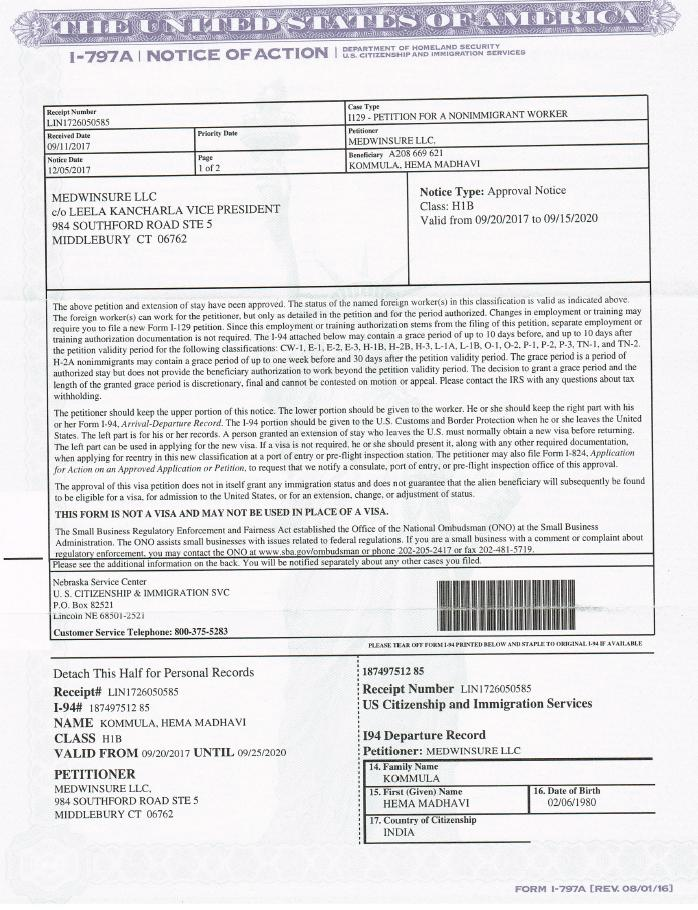

In [26]:
COMPAREIMG

## Testing Images

In [27]:
RUNNING = cv2.imread(MAINIMAGEFILEPNG)
titleimgCV = RUNNING[0:50, 10:650]
print(titleimgCV.shape)
titleNum = Image.fromarray(titleimgCV)
titleNum.save("Title.png")


(50, 640, 3)


In [28]:
RUNNING2 = cv2.imread(COMPAREIMAGEFILEPNG)
titleimgCV2= RUNNING2[0:50, 10:650]
print(titleimgCV2.shape)
titleNum2 = Image.fromarray(titleimgCV2)
titleNum2.save("COMPAREIMAGE.png")

(50, 640, 3)


In [29]:
original = titleimgCV2 #know real
duplicate = titleimgCV #dont know

In [30]:
threshold = 50
TITLEIMAGECOMPARE = False

In [31]:
original.shape 

(50, 640, 3)

In [32]:
duplicate.shape

(50, 640, 3)

In [33]:
if original.shape == duplicate.shape:
    print("The images have same size and channels")
    difference = cv2.subtract(original, duplicate)
    b, g, r = cv2.split(difference)
    if cv2.countNonZero(b) <= threshold and cv2.countNonZero(g) <= threshold and cv2.countNonZero(r) <= threshold:
        print("The images are completely Equal")
        TITLEIMAGECOMPARE = True
else:
    print("Fds")

The images have same size and channels


In [34]:
x,y = b.shape
size = x*y
countb = 0
for startthing1 in b:
    for endthomg1 in startthing1:
        if endthomg1 > 50:
            countb+=1
countg = 0
for startthing2 in g:
    for endthomg2 in startthing2:
        if endthomg2 > 50:
            countg+=1
countr = 0
for startthing3 in r:
    for endthomg3 in startthing3:
        if endthomg3 > 50:
            countr+=1
PERCENT_BLUE_DIFFERENCE_TITLE = countb/size*100
PERCENT_GREEN_DIFFERENCE_TITLE = countg/size*100
PERCENT_RED_DIFFERENCE_TITLE = countr/size*100
print(countb, " ", countg, " ", countr)
print(PERCENT_BLUE_DIFFERENCE_TITLE, " ", PERCENT_GREEN_DIFFERENCE_TITLE, " ", PERCENT_RED_DIFFERENCE_TITLE)

10608   10375   9076
33.15   32.421875   28.3625


# Text

In [35]:
def similar(a, b):
    return SequenceMatcher(None, a, b).ratio()

In [36]:
OCRPIC = MAINIMAGEFILEJPG
value=Image.open(OCRPIC)
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files (x86)\\Tesseract-OCR\\tesseract.exe"
text = pytesseract.image_to_string(value, config='')
OCRPIC = COMPAREIMAGEFILEPNG
value=Image.open(OCRPIC)
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files (x86)\Tesseract-OCR\tesseract.exe"
text2 = pytesseract.image_to_string(value, config='')

In [37]:
text

'Recelp{ Number\nEAC1719052120\n\n \n\nReceived Date Priority Date\n\n06/21/2017\n\nNotice Date Page : Ei\n09/08/2017, Lof2\n\n \n   \n     \n\nPROFUSION SYSS INC DBA STAFFING FR.\nc/o CHANDLER B SHARMA\n\nSHARMA YASKHI & ASSOCIATES LLP\n\n18 E 41ST ST STE 1704\nNEW YORK NY 10017\n\n   \n \n \n \n\nwithholding.\n\n   \n \n \n \n \n \n \n  \n\n \n    \n\n     \n\nPlease see the addition:\n\n    \n\n  \n\nVermont Service Center\n\nU, S. CITIZENSHIP & IMMIGRATION SVC\n75 Lower Welden Street\n\nSaint Albans VT 05479-0001\n\nCustomer Service Telephone: 800-375-5283\n\n    \n\n \n\n \n\n \n\nDetach This Half for Personal Records\nReceipt# EAC1719052120 ;\n1-94 906930476 30 ‘ S49\nNAME NUTAKKI, NAGESWARA RAO\nCLASS HIB ad :\nVALID FROM 09/08/2017 UNTIL 10/26/2019\n\nPETITIONER\n\nPROFUSION SYSS INC DBA STAFFING FR,\n825 GEORGES RD\n\nNORTH BRUNSWICK NJ_ 08902 +\n\nDEPARTMENT OF HOMELAND SECURITY\nU.S, CITIZENSHIP AND IMMIGRATION SERVICES\n\n  \n   \n \n\nMCT SS\n\n \n \n  \n\nCase Type\n1129 

In [38]:
yes = 0
no = 0
totoal = 0
for i in range(100):
    startingValueofSTring = random.randint(1,len(text2))
    lengthofString = random.randint(3,10)
    #startvalueofstring 
    small_string = text2[startingValueofSTring:startingValueofSTring+lengthofString]

    has_small_string = False
    if small_string in text:
        has_small_string = True
    if has_small_string:
        yes+=1
    else:
        no+=1
    totoal+=1
diffsimiliar = yes/totoal
diffdifferent = no/totoal
similiar = similar(text, text2)

## Output

In [39]:
if (similiar < 0.35):
    SIMILARTYBETWEENTEXTINDOCUMENT = False
else:
    SIMILARTYBETWEENTEXTINDOCUMENT = True
print(similiar)
print("SIMILAR: ", diffsimiliar)
print("DIFFERENT: ", diffdifferent)

0.06575272911906575
SIMILAR:  0.52
DIFFERENT:  0.48


# WaterMark

## Basic Removal of TestingIMAGE

In [40]:
img1 = cv2.imread(MAINIMAGEFILEPNG)
img1 = cv2.resize(img1, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)

910 698


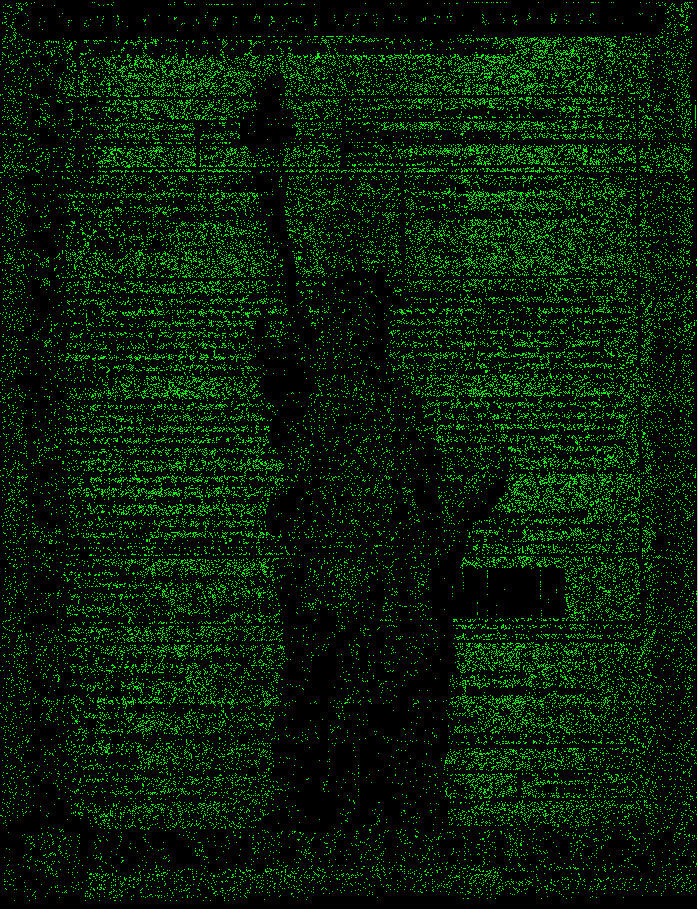

In [41]:
down = 239#238 ----- 239 
up = 248 # ---------248
array = img1
arrayNew = img1
w, h, j = array.shape
print(w, h)
for x in range(w-1):
    for y in range(h-1):
        """
        num = random.randint(0,3000)
        if num == 555:
            print (x, y)
            print(array[x, y])
        """
        try:
            singlearray = array[x, y]
            r = singlearray[0]
            g = singlearray[1]
            b = singlearray[2]
            """
            if r > thres and r < thres and g > thres and g < thres and b > thres and b < thres:
                arrayNew[x,y] = [255,255,255]
                print(\True\)
            """
            #print(array[x,y])
            #240, 245
            #230, 240

            if (r > down and r < up and g > down and g < up and b > down
                    and b < up):
                arrayNew[x, y] = [0, 255, 0]
            else:
                arrayNew[x, y] = [0, 0, 0]
        except:
            print(x, y)
img = Image.fromarray(arrayNew)
img

In [42]:
im1 = img.save("TestingImageWaterMark.jpg")

## Basic Removal of Real IMAGE

910 698
10118   114505   0   124623


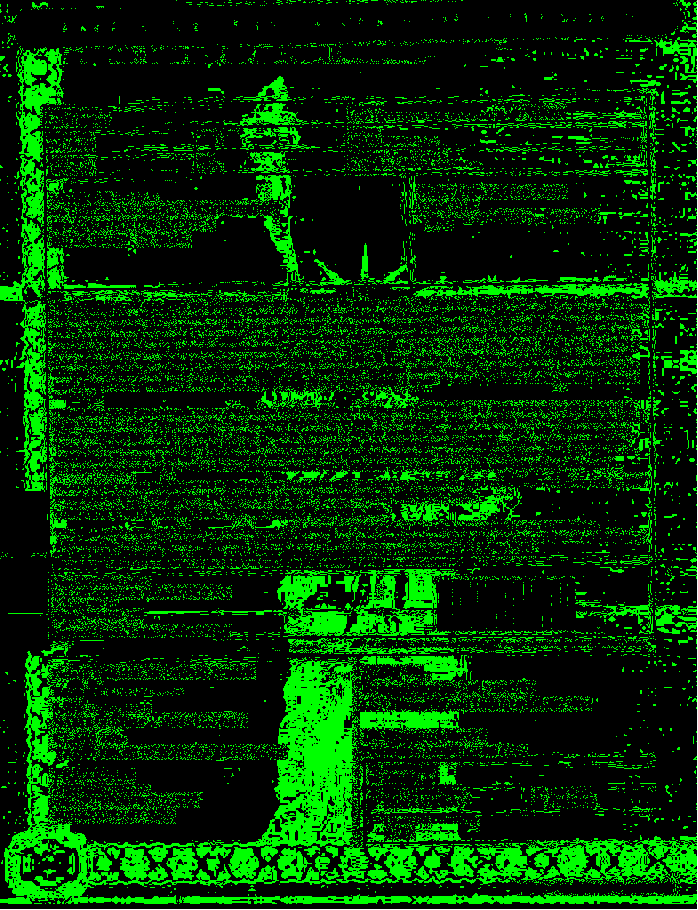

In [43]:
img2 = cv2.imread(COMPAREIMAGEFILEPNG)
img2 = cv2.resize(img2, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)
down2 = 239#238 ----- 239 
up2 = 248 # ---------248
array2 = img2
arrayNew2 = img2
w2, h2, j2 = array2.shape
print(w2, h2)
falsepixel = 0
correctpixel = 0
errorpixel = 0
totalpixel = 0
for x2 in range(w2-1):
    for y2 in range(h2-1):
        singlearray2 = array2[x2, y2]
        r2 = singlearray2[0]
        g2 = singlearray2[1]
        b2 = singlearray2[2]
        if (r2 > down2 and r2 < up2 and g2 > down2 and g2 < up2 and b2 > down2 and b2 < up2):
            arrayNew2[x2, y2] = [0, 255, 0]

            singlearray = array[x2,y2]
            r = singlearray[0]
            g = singlearray[1]
            b = singlearray[2]
            if (r == 0 and g == 0 and b == 0):
                falsepixel+=1

            elif (r == 0 and g == 255 and b == 0):
                correctpixel +=1
            else:
                errorpixel += 1
            totalpixel+=1
        else:
            arrayNew2[x2, y2] = [0, 0, 0]

img2final = Image.fromarray(arrayNew2)
print(correctpixel, " ", falsepixel, " ", errorpixel, " ", totalpixel)
img2final

In [44]:
im1 = img.save("REALImageWaterMark.jpg")

## FINAL COMPARE OF WATERMARK

### RESIZE IMAHE

In [45]:
down = 239#238 ----- 239 
up = 248 # ---------248
file2 = COMPAREIMAGEFILEPNG
file1 = MAINIMAGEFILEPNG
array = cv2.imread(file1)
array2 = cv2.imread(file2)
arrayNew = cv2.imread(file1)
arrayNew2 = cv2.imread(file2)
array = cv2.resize(array, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)
array2 = cv2.resize(array2, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)
arrayNew = cv2.resize(arrayNew, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)
arrayNew2 = cv2.resize(arrayNew2, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)
w,h,c = array.shape
w2,h2,c2 = array2.shape
NUMOFPIXELSHOULDTHEREBUTNOT = 0
NUMOFPIXELNOTBUTTHERE = 0
NUMOFCORRECTPIXEL = 0
totalCOUNT = 0
for x in range(w-1):
    for y in range(h-1):
        singlearray = array[x, y]
        r = singlearray[0]
        g = singlearray[1]
        b = singlearray[2]

        if (r > down and r < up and g > down and g < up and b > down and b < up):
            definitivVALUE = True
            totalCOUNT+=1
            arrayNew[x, y] = [0, 255, 0]
        else:
            definitivVALUE = False
            arrayNew[x, y] = [0, 0, 0]

        singlearray2 = array2[x, y]
        r2 = singlearray2[0]
        g2 = singlearray2[1]
        b2 = singlearray2[2]
        if (r2 > down and r2 < up and g2 > down and g2 < up and b2 > down and b2 < up):
            pixelDONTKNOW = True

        else:
            pixelDONTKNOW = False

        if(definitivVALUE and pixelDONTKNOW):
            #WHEN PIXEL SHOULD BE IN RANGE AND IS IN RANGE
            NUMOFCORRECTPIXEL+=1
        elif(definitivVALUE and not pixelDONTKNOW):
            #WHEN PIXEL SHOULD BE IN RANGE BUT ISNT
            NUMOFPIXELSHOULDTHEREBUTNOT+=1
        elif(not definitivVALUE and definitivVALUE):
            #WHEN PIXEL SHOULDN'T BE IN RANGE BUT IS
            NUMOFPIXELNOTBUTTHERE+=1      
img = Image.fromarray(arrayNew)
img
print(NUMOFCORRECTPIXEL, "   ", NUMOFPIXELSHOULDTHEREBUTNOT,"   ", NUMOFPIXELNOTBUTTHERE, "   ", totalCOUNT)

10118     56833     0     66951


## Compare Value Around Pixel

In [46]:
def valueAroundPixel(x, y, array, distance):
    countBlack = 0
    countGreen = 0
    singlearray = array[x, y]
    r_center = singlearray[0]
    g_center = singlearray[1]
    b_center = singlearray[2]

    uparray = array[x, y + distance]
    r_UP = uparray[0]
    g_UP = uparray[1]
    b_UP = uparray[2]
    if r_UP == 0 and g_UP == 0 and b_UP == 0:
        countBlack+=1
    else:
        countGreen+=1

    #_----------------------------------------------------------------------------------
    downarray = array[x, y - distance]
    r_DOWN = downarray[0]
    g_DOWN = downarray[1]
    b_DOWN = downarray[2]
    if r_DOWN == 0 and g_DOWN == 0 and b_DOWN == 0:
        countBlack+=1
    else:
        countGreen+=1
    #_----------------------------------------------------------------------------------
    rightarray = array[x + distance, y]
    r_right = rightarray[0]
    g_right = rightarray[1]
    b_right = rightarray[2]
    if r_right == 0 and g_right == 0 and b_right == 0:
        countBlack+=1
    else:
        countGreen+=1
    #_----------------------------------------------------------------------------------
    leftarray = array[x - distance, y]
    r_left = leftarray[0]
    g_left = leftarray[1]
    b_left = leftarray[2]
    if r_left == 0 and g_left == 0 and b_left == 0:
        countBlack+=1
    else:
        countGreen+=1
    #_----------------------------------------------------------------------------------
    UPRightarray = array[x + distance, y + distance]
    r_upright = UPRightarray[0]
    g_upright = UPRightarray[1]
    b_upright = UPRightarray[2]
    if r_upright == 0 and g_upright == 0 and b_upright == 0:
        countBlack+=1
    else:
        countGreen+=1
    #_----------------------------------------------------------------------------------
    UPLeftarray = array[x - distance, y + distance]
    r_upleft = UPLeftarray[0]
    g_upleft = UPLeftarray[1]
    b_upleft = UPLeftarray[2]
    if r_upleft == 0 and g_upleft == 0 and b_upleft == 0:
        countBlack+=1
    else:
        countGreen+=1
    #_----------------------------------------------------------------------------------
    DownRightarray = array[x + distance, y - distance]
    r_downright = DownRightarray[0]
    g_downright = DownRightarray[1]
    b_downright = DownRightarray[2]
    if r_downright == 0 and g_downright == 0 and b_downright == 0:
        countBlack+=1
    else:
        countGreen+=1
    #_----------------------------------------------------------------------------------
    DownLeftArray = array[x - distance, y - distance]
    r_downleft = DownLeftArray[0]
    g_downleft = DownLeftArray[1]
    b_downleft = DownLeftArray[2]
    if r_downleft == 0 and g_downleft == 0 and b_downleft == 0:
        countBlack+=1
    else:
        countGreen+=1
    #_----------------------------------------------------------------------------------


    return (countBlack, countGreen)

## Final Compare Around PIXEL WITH DISTANCE

In [47]:
file1 = 'REALImageWaterMark.jpg'

In [48]:
array = cv2.imread(file1)
x = len(array)

In [49]:
row = []
column = []
array = cv2.imread(file1)
x_length = len(array[0])
y_length = len(array)
print("Width: ",x_length,"Height: ", y_length)
for i in range(x_length):
    row.append(str(i))
for i in range(y_length):
    column.append(str(i))
df = pd.DataFrame(index=row, columns=column)

Width:  698 Height:  910


In [50]:
print(len(df))

698


In [51]:
for x in range(x_length-1):
    for y in range(y_length-1):
        try:
            df['{}'.format(y)]['{}'.format(x)] = array[y][x] #910, 698
        except:
            print(x,y)
df.to_excel(r'numpyARRAY.xlsx', sheet_name='test1')

In [52]:
file1 = 'REALImageWaterMark.jpg'
array = cv2.imread(file1)
arrayNew = cv2.imread(file1)
img = Image.open(file1)
w, h = img.size
rgb_im = img.convert('RGB')

In [53]:
count = 0
for i in array[0]:
    arraytest=[]
    a,b,c = i
    if a < 20 and b > 250 and c < 20:
        count+=1

In [54]:
%%time
file1 = 'REALImageWaterMark.jpg'
array = cv2.imread(file1)
arrayNew = cv2.imread(file1)
img = Image.open(file1)
w, h = img.size
rgb_im = img.convert('RGB')
NUMOFPIXELSHOULDTHEREBUTNOTAVERAGE = 0
NUMOFPIXELNOTBUTTHEREAVERAGE = 0
NUMOFCORRECTPIXELAVERAGE = 0
totalCOUNTAVERAGE = 0
definitivVALUEAVERAGE = False
print(w, h)
distance = 2
dis = distance
for thingthing in range(len(array[0])-distance):
    for thingthingYY in range(len(array)-distance):
        center_XXX = thingthing
        center_YYY = thingthingYY
        distance = dis
        partArrDis = [[0 for x in range(distance*2+1)] for y in range(distance*2+1)]
        center_XX = center_XXX
        center_YY = center_YYY
        for uu in range(distance*2+1):
            for rr in range(distance*2+1):
                a,b,c = array[uu+(thingthingYY-distance*2+1)][rr+(thingthing-distance*2+1)]
                theSingleArrayABC = [a,b,c]
                partArrDis[uu][rr] = theSingleArrayABC
        countGreen = 0
        countBlack = 0
        totalCount = 0
        theXofARRRAY = len(partArrDis)
        theYofARRRAY = len(partArrDis[0])
        for aa in range(theXofARRRAY):
            for bb in range(theYofARRRAY):
                singleARRAYwPART = partArrDis[aa][bb]
                rr, gg, bb = singleARRAYwPART
                if rr < 30 and gg < 30 and bb < 30:
                    countBlack += 1
                else:
                    countGreen += 1    
                totalCount+=1
        perceBlack = (countBlack/totalCount) * 100
        perceGreen = (countGreen/totalCount) * 100
        x = perceBlack+perceGreen
        IDK_X = center_XXX-distance*2+1
        IDK_Y = center_YYY-distance*2+1
        if (perceBlack > 40):
            arrayNew[IDK_Y][IDK_X]=[0,0,0]
            definitivVALUEAVERAGE = False
        else:
            arrayNew[IDK_Y][IDK_X] = [0,255,0]
            definitivVALUEAVERAGE = True
        singlearray2 = array2[thingthingYY, thingthing]
        r2 = singlearray2[0]
        g2 = singlearray2[1]
        b2 = singlearray2[2]
        if (r2 > down and r2 < up and g2 > down and g2 < up and b2 > down and b2 < up):
            pixelDONTKNOWAVERAGE = True
        else:
            pixelDONTKNOWAVERAGE = False
        if(definitivVALUEAVERAGE and pixelDONTKNOWAVERAGE):
            #WHEN PIXEL SHOULD BE IN RANGE AND IS IN RANGE
            NUMOFCORRECTPIXELAVERAGE+=1
        elif(definitivVALUEAVERAGE and not pixelDONTKNOWAVERAGE):
            #WHEN PIXEL SHOULD BE IN RANGE BUT ISNT
            NUMOFPIXELSHOULDTHEREBUTNOTAVERAGE+=1
        elif(not definitivVALUEAVERAGE and definitivVALUEAVERAGE):
            #WHEN PIXEL SHOULDN'T BE IN RANGE BUT IS
            NUMOFPIXELNOTBUTTHEREAVERAGE+=1     
        totalCOUNTAVERAGE+=1
print(NUMOFCORRECTPIXELAVERAGE, "   ", NUMOFPIXELSHOULDTHEREBUTNOTAVERAGE,"   ", NUMOFPIXELNOTBUTTHEREAVERAGE, "   ", totalCOUNTAVERAGE)          

698 910
5225     39407     0     631968
Wall time: 2min 8s


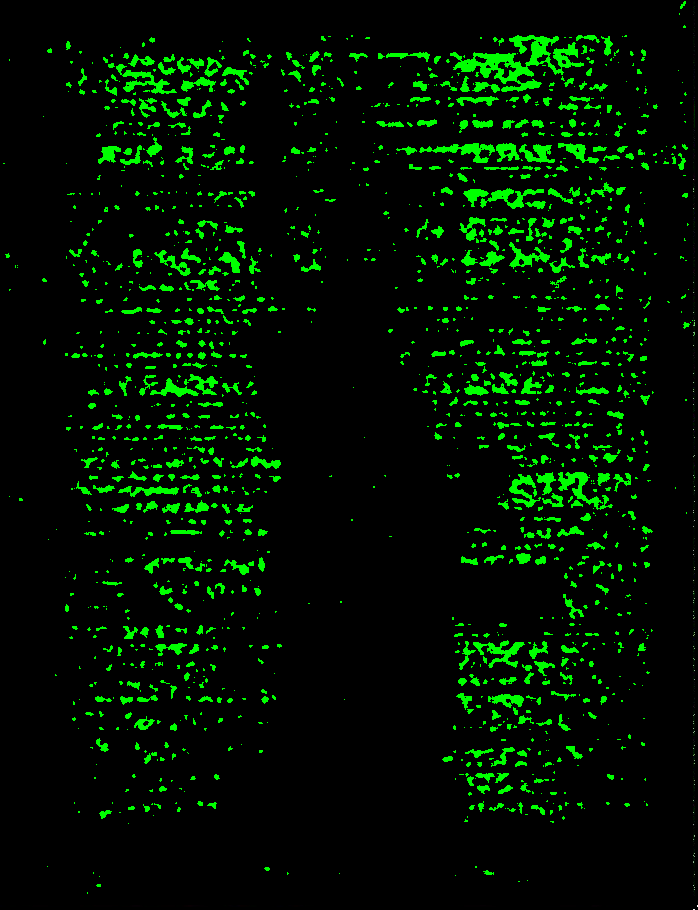

In [55]:
img = Image.fromarray(arrayNew)
im1 = img.save("GroupedPixeledIMAGE.jpg")
img

## Output

In [56]:
"""
print(NUMOFCORRECTPIXEL, \"   \", NUMOFPIXELSHOULDTHEREBUTNOT, \"   \", NUMOFPIXELNOTBUTTHERE, \" \", totalCOUNT)\n",
coorect = NUMOFCORRECTPIXEL/totalCOUNT
worng = NUMOFPIXELSHOULDTHEREBUTNOT/totalCOUNT
print(coorect, \" and \", worng)
if coorect < 0.075 or worng < 0.9:
    WATERMARKOUTPUTFINAL = False
else:
    WATERMARKOUTPUTFINAL = True
"""

'\nprint(NUMOFCORRECTPIXEL, "   ", NUMOFPIXELSHOULDTHEREBUTNOT, "   ", NUMOFPIXELNOTBUTTHERE, " ", totalCOUNT)\n",\ncoorect = NUMOFCORRECTPIXEL/totalCOUNT\nworng = NUMOFPIXELSHOULDTHEREBUTNOT/totalCOUNT\nprint(coorect, " and ", worng)\nif coorect < 0.075 or worng < 0.9:\n    WATERMARKOUTPUTFINAL = False\nelse:\n    WATERMARKOUTPUTFINAL = True\n'

In [57]:
print(correctpixel, " ", falsepixel, " ", errorpixel, " ", totalpixel)
print(NUMOFCORRECTPIXELAVERAGE, "   ", NUMOFPIXELSHOULDTHEREBUTNOTAVERAGE,"   ", NUMOFPIXELNOTBUTTHEREAVERAGE, "   ", totalCOUNTAVERAGE) 
print(NUMOFCORRECTPIXEL, "   ", NUMOFPIXELSHOULDTHEREBUTNOT,"   ", NUMOFPIXELNOTBUTTHERE, "   ", totalCOUNT)

10118   114505   0   124623
5225     39407     0     631968
10118     56833     0     66951


In [58]:
WATERMARKOUTPUTFINAL=False
WATERMARKOUTPUTave=False
WATERMARKOUTPUT2=False
WATERMARKOUTPUTFINAL=False
coorect = correctpixel/totalpixel*100
worng = falsepixel/totalpixel*100
error = errorpixel

aveCorrect = NUMOFCORRECTPIXELAVERAGE/totalCOUNTAVERAGE *100
aveWRONG = NUMOFPIXELSHOULDTHEREBUTNOTAVERAGE/totalCOUNTAVERAGE *100
aveERROR = NUMOFPIXELNOTBUTTHEREAVERAGE

correctPT2 = NUMOFCORRECTPIXEL/totalCOUNT *100
wrongPT2= NUMOFPIXELSHOULDTHEREBUTNOT/totalCOUNT*100
errorPT2 = NUMOFPIXELNOTBUTTHERE

if error > 700+950 or aveERROR > 700+950 or errorPT2 > 700+950:
    print("ERROR PLEASE CHECK")
if coorect < 10:
    WATERMARKOUTPUT1 = False
else:
    WATERMARKOUTPUT1 = True
if aveCorrect < 10:
    WATERMARKOUTPUTave = False
else:
    WATERMARKOUTPUTave = True
if correctPT2 < 10:
    WATERMARKOUTPUT2 = False
else:
    WATERMARKOUTPUT2 = True

if WATERMARKOUTPUT1 == True and WATERMARKOUTPUTave == True and WATERMARKOUTPUT2 == True: 
    WATERMARKOUTPUTFINAL = True
elif WATERMARKOUTPUT1 == True and WATERMARKOUTPUTave == True and WATERMARKOUTPUT2 == False: 
    WATERMARKOUTPUTFINAL = True
elif WATERMARKOUTPUT1 == False and WATERMARKOUTPUTave == True and WATERMARKOUTPUT2 == True: 
    WATERMARKOUTPUTFINAL = True
elif WATERMARKOUTPUT1 == True and WATERMARKOUTPUTave == False and WATERMARKOUTPUT2 == True: 
    WATERMARKOUTPUTFINAL = True

In [59]:
print(WATERMARKOUTPUT1)
print(WATERMARKOUTPUTave)
print(WATERMARKOUTPUT2)

False
False
True


In [60]:
WATERMARKOUTPUTFINAL

False

# Compare IMAGES

## Image Size

In [61]:
print("Shape for image 1:")
print(x11, " ", y11, " ", z11)
print("Shape for image 2:")
print(x2, " ", y2, " ", z2)

Shape for image 1:
1735   1341   3
Shape for image 2:
908   696   3


# SSIM DIFFERENCE

In [62]:
imageA = img1
imageB = img2


grayA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)

print(imageA.shape)
print(imageB.shape)
bigH, bigW,other = imageA.shape

(910, 698, 3)
(910, 698, 3)


In [63]:
(score, diff) = compare_ssim(grayA, grayB, full=True)
diff = (diff * 255).astype('uint8')
print("SSIM: {}".format(score))

# threshold the difference image, followed by finding contours to
# obtain the regions of the two input images that differ
thresh = cv2.threshold(diff, 0, 255,cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

SSIM: 0.03599363275978038


In [64]:
areaDIFFERENCE = 0
# loop over the contours
for c in cnts:
    (x, y, w, h) = cv2.boundingRect(c)
    cv2.rectangle(imageA, (x, y), (x + w, y + h), (0, 0, 255), 2)
    cv2.rectangle(imageB, (x, y), (x + w, y + h), (0, 0, 255), 2)
    areaDIFFERENCE += (w*h)

perdiff =  ((areaDIFFERENCE/(bigW*bigH))*100)
print("The percent different is ", ((areaDIFFERENCE/(bigW*bigH))*100))

The percent different is  101.96117635945716


## Output

In [65]:
print("The percent different is ", ((areaDIFFERENCE/(bigW*bigH))*100))

The percent different is  101.96117635945716


In [66]:
#cv2.imshow(\"Original\", imageA)
#cv2.imshow(\"Modified\", imageB)
#cv2.imshow(\"Diff\", diff)
#cv2.imshow(\"Thresh\", thresh)
#cv2.waitKey(0)
#cv2.destroyAllWindows()
# OVERLAY THE IMAGE

# Compare Images

## Display All main points of connectors

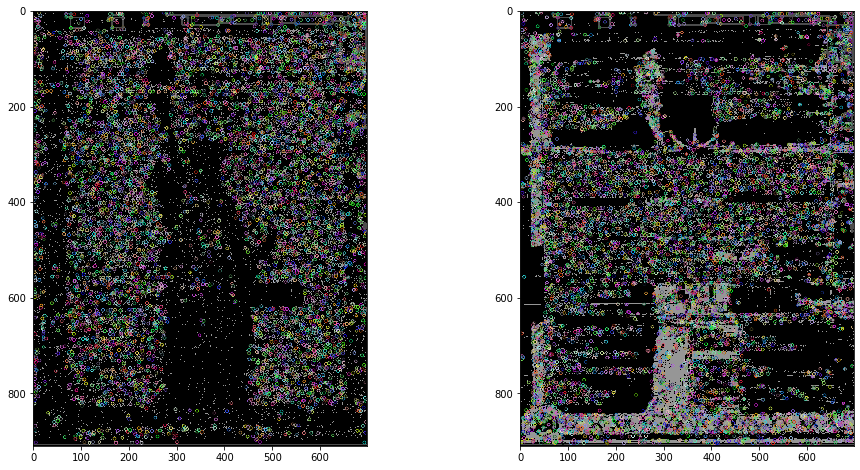

In [67]:
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.xfeatures2d.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)
NUMBER_OF_KEYPOINST_IMG1 = len(keypoints_1)
NUMBER_OF_KEYPOINST_IMG2 = len(keypoints_2)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
img_2 = cv2.drawKeypoints(gray2,keypoints_2,img2)


figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1)
ax[1].imshow(img2)

## Display Both Images

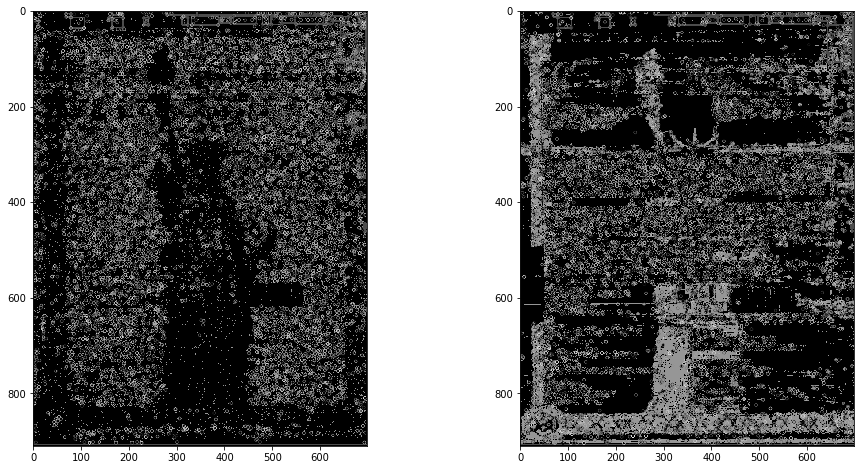

In [68]:
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

## All lines compare

12009 11329


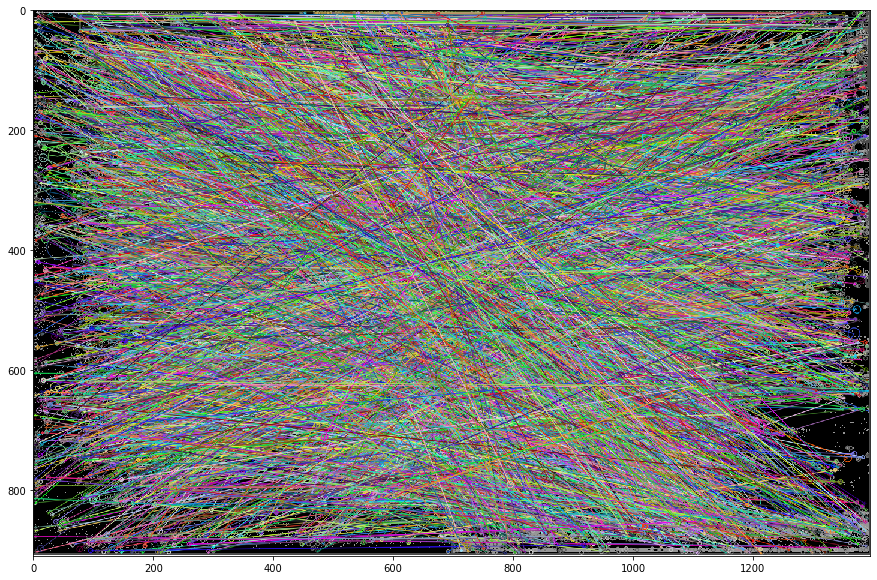

In [69]:
sift = cv2.xfeatures2d.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)
print(len(keypoints_1), len(keypoints_2))

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
#print(matches)
matches = sorted(matches, key = lambda x:x.distance)
totalMATCHES = (len(matches))
img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches, img2, flags=6)#flags orginally 2 and must be even
im = Image.fromarray(img3)
im.save('difference.png')
fig = plt.figure(figsize=(15,15))
plt.imshow(img3)
plt.show()


## Single line compare

[[<DMatch 00000200928BEA10>, <DMatch 00000200928BECF0>]]


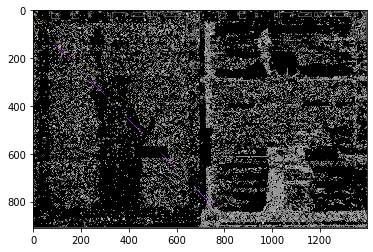

(<matplotlib.image.AxesImage at 0x2009287c448>, None)

In [70]:
sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
#print(des1, des2)
matches = bf.knnMatch(des1,des2, k=2)

"""
DMatch.distance - Distance between descriptors. The lower, the better it is.
DMatch.trainIdx - Index of the descriptor in train descriptors
DMatch.queryIdx - Index of the descriptor in query descriptors
DMatch.imgIdx - Index of the train image.
"""
"""
# Apply ratio test
good = []
#print(matches)
for m,n in matches:
    print(m.distance)
    print("             ", n.distance)
    if m.distance < 0.75*n.distance:
        good.append([m])
"""
test1 = matches[12:13]
print(test1)

img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,matches[12:13],None,flags =2)



plt.imshow(img3),plt.show()

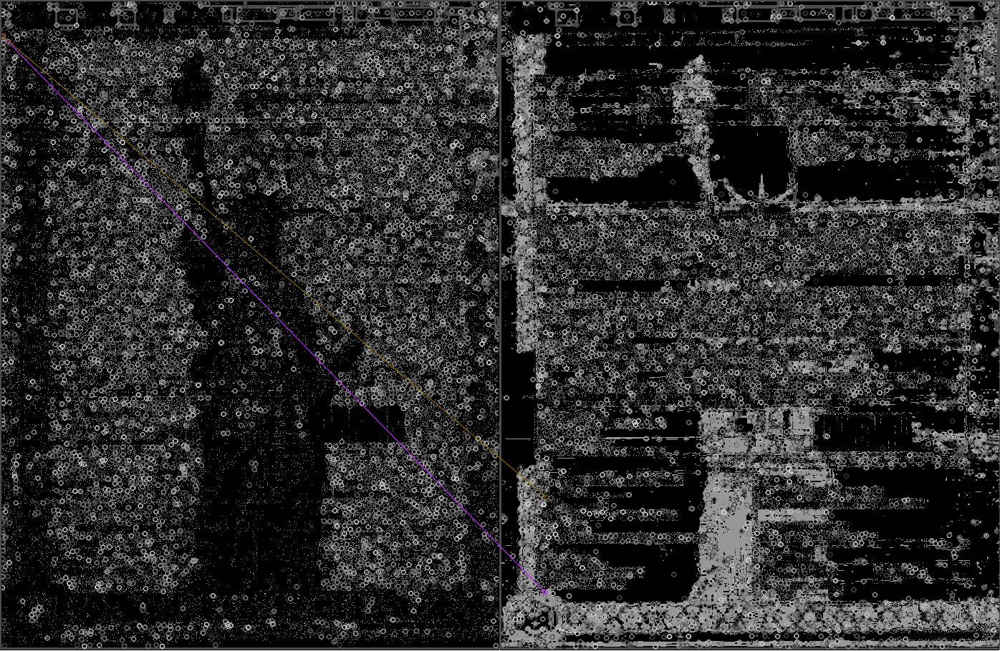

In [71]:
im = Image.fromarray(img3)
im

In [72]:
cv2.drawMatchesKnn.__doc__

'drawMatchesKnn(img1, keypoints1, img2, keypoints2, matches1to2, outImg[, matchColor[, singlePointColor[, matchesMask[, flags]]]]) -> outImg\n.   @overload'

## Ratio threshold

In [73]:
if img1 is None or img2 is None:
    print('Could not open or find the images!')
    exit(0)
#-- Step 1: Detect the keypoints using SURF Detector, compute the descriptors


minHessian = 400
detector = cv2.xfeatures2d_SURF.create(hessianThreshold=minHessian)
keypoints1, descriptors1 = detector.detectAndCompute(img1, None)
keypoints2, descriptors2 = detector.detectAndCompute(img2, None)
#-- Step 2: Matching descriptor vectors with a FLANN based matcher
# Since SURF is a floating-point descriptor NORM_L2 is used
matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
knn_matches = matcher.knnMatch(descriptors1, descriptors2, 2)
#-- Filter matches using the Lowe's ratio test
ratio_thresh = 0.7
good_matches = []
for m,n in knn_matches:
    if m.distance < ratio_thresh * n.distance:
        good_matches.append(m)
print((len(good_matches)))
#-- Draw matches
img_matches = np.empty((max(img1.shape[0], img2.shape[0]), img1.shape[1]+img2.shape[1], 3), dtype=np.uint8)
cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches, img_matches, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#-- Show detected matches
#cv2.imshow('Good Matches', img_matches)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

32


array([[[ 76,  76,  76],
        [ 76,  76,  76],
        [ 76,  76,  76],
        ...,
        [ 76,  76,  76],
        [ 76,  76,  76],
        [ 76,  76,  76]],

       [[ 76,  76,  76],
        [ 76,  76,  76],
        [ 76,  76,  76],
        ...,
        [ 76,  76,  76],
        [ 76,  76,  76],
        [ 76,  76,  76]],

       [[ 76,  76,  76],
        [ 76,  76,  76],
        [  0,   0,   0],
        ...,
        [150, 150, 150],
        [  0,   0,   0],
        [ 76,  76,  76]],

       ...,

       [[ 76,  76,  76],
        [ 76,  76,  76],
        [ 76,  76,  76],
        ...,
        [ 76,  76,  76],
        [ 76,  76,  76],
        [ 76,  76,  76]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [74]:
rationVALarray = []
for i in range(0,(int((1.0/0.05)+(1)))):
    rationVALarray.append(format((i*0.05),'.2f'))
lenTOTAL = []
for i in rationVALarray:
    good_matches=[]
    ratio_thresh = i
    for m,n in knn_matches:
        if m.distance < float(ratio_thresh) * n.distance:
            good_matches.append(m)
    #print(i, " ", len(good_matches))
    lenTOTAL.append(len(good_matches))

In [75]:
IMAGE1NAME = MAINIMAGEFILEPNG
img1 = cv2.imread(IMAGE1NAME)
img1 = cv2.resize(img1, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)
IMAGE2NAME = COMPAREIMAGEFILEPNG
img2 = cv2.imread(IMAGE2NAME) 
img2 = cv2.resize(img2, dsize=(698, 910), interpolation=cv2.INTER_CUBIC)


img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

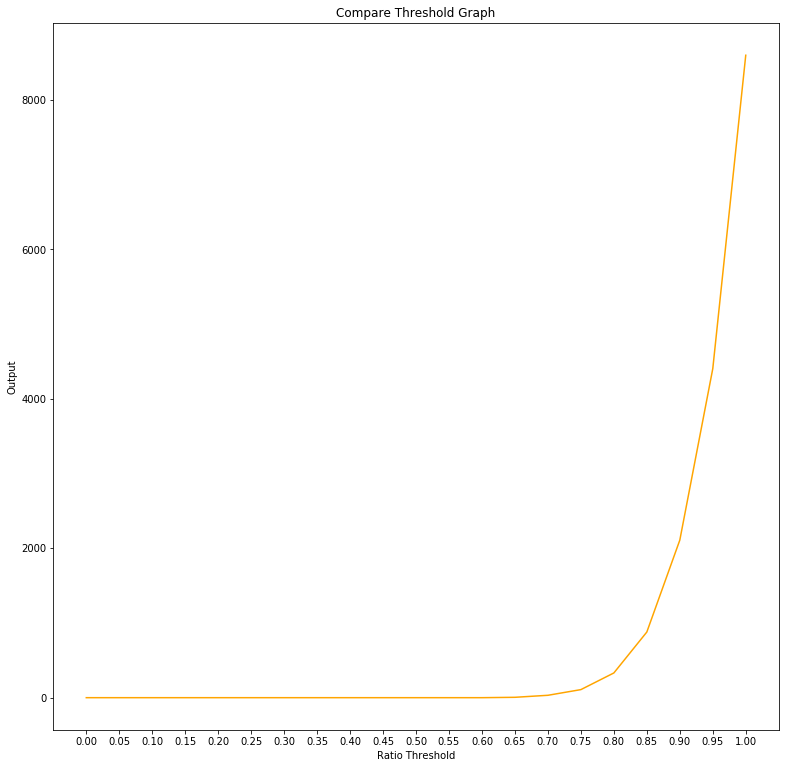

In [76]:
fig = plt.figure(figsize=(13,13))
plt.plot(rationVALarray, lenTOTAL, color='orange')
plt.xlabel('Ratio Threshold')
plt.ylabel('Output')
plt.title('Compare Threshold Graph')
plt.show()

In [77]:
rationVALarray = []
for i in range(0,(int((1.0/0.05)+(1)))):
    rationVALarray.append(format((i*0.05),'.2f'))
aList = []
for i in range(10):
    minHessian = 400
    detector = cv2.xfeatures2d_SURF.create(hessianThreshold=minHessian)
    keypoints1, descriptors1 = detector.detectAndCompute(img1, None)
    keypoints2, descriptors2 = detector.detectAndCompute(img2, None)
    #-- Step 2: Matching descriptor vectors with a FLANN based matcher
    # Since SURF is a floating-point descriptor NORM_L2 is used
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    knn_matches = matcher.knnMatch(descriptors1, descriptors2, 2)
    #-- Filter matches using the Lowe's ratio test 
    lenTOTAL = []
    for i in rationVALarray:
        good_matches=[]
        ratio_thresh = i
        for m,n in knn_matches:
            if m.distance < float(ratio_thresh) * n.distance:
                good_matches.append(m)
        #print(i, " ", len(good_matches))
        lenTOTAL.append(len(good_matches))
    #print(lenTOTAL)
    aList.append(lenTOTAL)

[0, 0, 0, 0, 1, 9, 21, 44, 81, 140, 220, 332, 467, 632, 851, 1141, 1561, 2217, 3272, 5005, 7621]
[0, 0, 0, 0, 2, 9, 20, 48, 85, 148, 227, 326, 462, 636, 845, 1153, 1578, 2241, 3295, 5011, 7621]
[0, 0, 0, 0, 1, 9, 17, 44, 84, 146, 221, 333, 471, 630, 853, 1153, 1563, 2235, 3267, 4986, 7621]
[0, 0, 0, 0, 1, 9, 19, 48, 82, 144, 220, 323, 453, 614, 823, 1113, 1540, 2188, 3272, 4964, 7621]
[0, 0, 0, 0, 1, 10, 20, 45, 81, 151, 223, 325, 456, 636, 841, 1138, 1570, 2246, 3314, 4998, 7621]
[0, 0, 0, 0, 1, 8, 21, 48, 86, 142, 229, 330, 466, 641, 854, 1146, 1598, 2248, 3298, 4997, 7621]
[0, 0, 0, 0, 1, 12, 20, 46, 85, 144, 225, 334, 467, 638, 851, 1137, 1566, 2241, 3266, 4986, 7621]
[0, 0, 0, 0, 1, 11, 17, 47, 83, 149, 222, 329, 460, 631, 842, 1129, 1592, 2289, 3309, 4999, 7621]
[0, 0, 0, 0, 1, 9, 17, 50, 85, 142, 222, 326, 454, 631, 862, 1159, 1574, 2255, 3294, 4996, 7621]
[0, 0, 0, 0, 2, 9, 21, 47, 81, 148, 223, 328, 467, 643, 854, 1137, 1541, 2217, 3251, 4936, 7621]


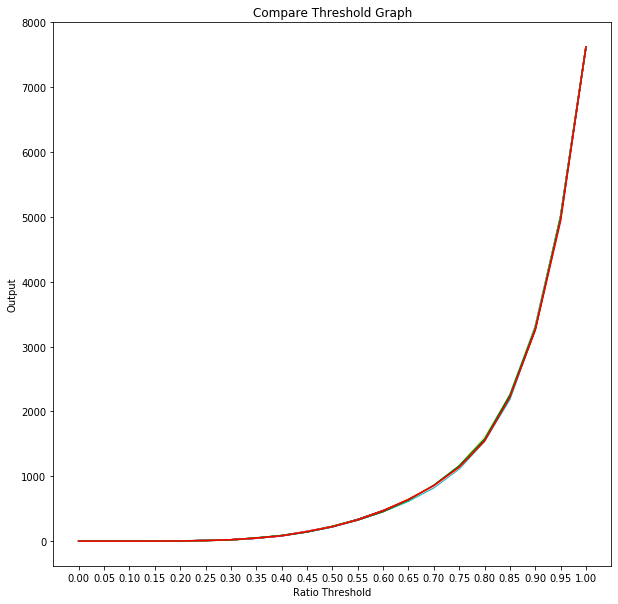

In [78]:
%matplotlib inline
fig = plt.figure(figsize=(10,10))
colors = ['b', 'g', 'r', 'c','m' ,'y', 'k','w','g', 'r']
for i in range(len(aList)):
    print(aList[i])
    plt.plot(rationVALarray, aList[i], color=colors[i])
plt.xlabel('Ratio Threshold')
plt.ylabel('Output')
plt.title('Compare Threshold Graph')
plt.show()

In [79]:
#print(aList[i])
#count = i+1
#for j in range(len(aList[i])):
    #print(aList[i][count])
#print(aList[i][i])
totalCompare =[]
for k in range(len(aList[0])):
    singlecompareArray=[]
    for i in range(len(aList)):
        singlecompareArray.append(aList[i][k])
    totalCompare.append(singlecompareArray)

In [80]:
dataset= aList[0]
mean= np.mean(dataset)
median = np.median(dataset)
mode= stats.mode(dataset)

print("Mean: ", mean)
print("Median: ", median)
print("Mode: ", mode)

Mean:  1124.5238095238096
Median:  220.0
Mode:  ModeResult(mode=array([0]), count=array([4]))


In [81]:
perfectArray = []
for i in range(len(totalCompare)):
    perfectArray.append(statistics.median(totalCompare[i]))

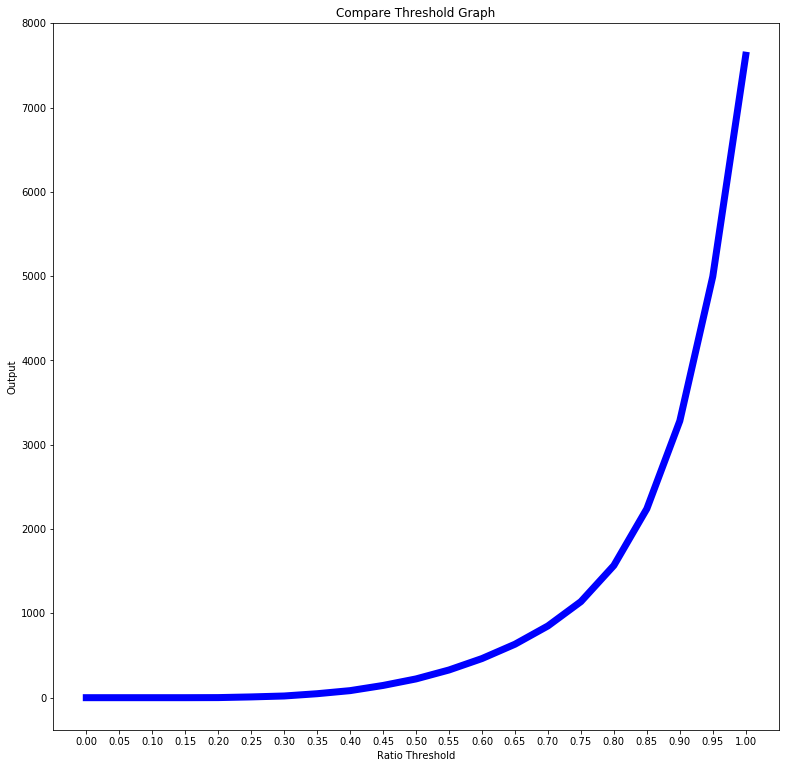

In [82]:
fig = plt.figure(figsize=(13,13))
plt.plot(rationVALarray, perfectArray, color='blue',linewidth=7.0)
plt.xlabel('Ratio Threshold')
plt.ylabel('Output')
plt.title('Compare Threshold Graph')
plt.show()

In [83]:
"""

BASED ON THIS GRAPH YOU CAN SEE THAT THE AVERAGE VALUE THAT IS BEST FOR THE GRAPH WILL BE 0.64

    /-------\         --------      |       | 
    |       |         |             |       |
    |       |         |             |       |
    |       |         |-----\        \------/
    |       |         |     |               |
    |       |   /\    |     |               |
    \-------/   \/    |-----/               | 
"""

'\n\nBASED ON THIS GRAPH YOU CAN SEE THAT THE AVERAGE VALUE THAT IS BEST FOR THE GRAPH WILL BE 0.64\n\n    /-------\\         --------      |       | \n    |       |         |             |       |\n    |       |         |             |       |\n    |       |         |-----\\        \\------/\n    |       |         |     |               |\n    |       |   /\\    |     |               |\n    \\-------/   \\/    |-----/               | \n'

## FINAL RUN

596


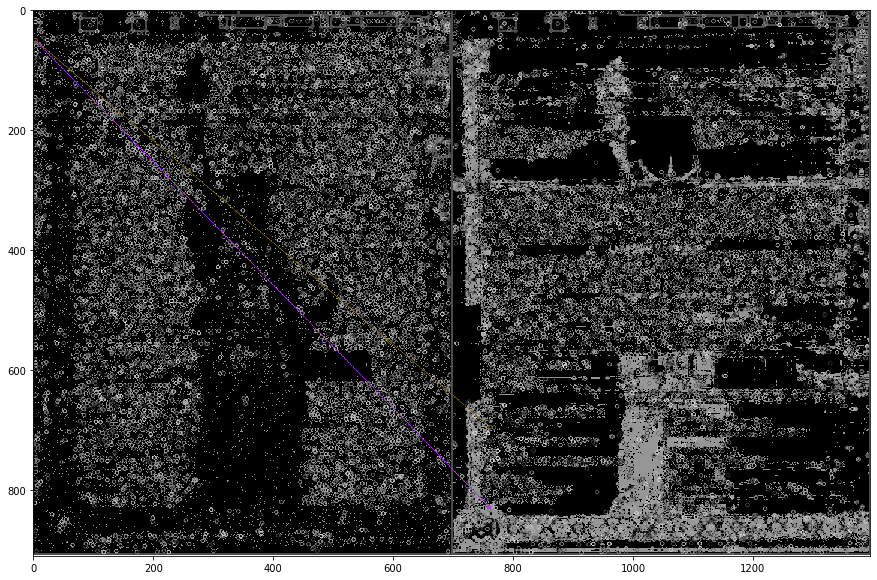

In [84]:
if img1 is None or img2 is None:
    print('Could not open or find the images!')
    exit(0)

minHessian = 400
detector = cv2.xfeatures2d_SURF.create(hessianThreshold=minHessian)
keypoints1, descriptors1 = detector.detectAndCompute(img1, None)
keypoints2, descriptors2 = detector.detectAndCompute(img2, None)
#-- Step 2: Matching descriptor vectors with a FLANN based matcher
# Since SURF is a floating-point descriptor NORM_L2 is used
matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
knn_matches = matcher.knnMatch(descriptors1, descriptors2, 2)
#-- Filter matches using the Lowe's ratio test
ratio_thresh = 0.64
good_matches = []
for m,n in knn_matches:
    if m.distance < ratio_thresh * n.distance:
        good_matches.append(m)
print((len(good_matches)))
#-- Draw matches
img_matches = np.empty((max(img1.shape[0], img2.shape[0]), img1.shape[1]+img2.shape[1], 3), dtype=np.uint8)
cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches, img_matches, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#-- Show detected matches
im = Image.fromarray(img3)
im.save('FINALWORKINGIMAGEPT1.png')
fig = plt.figure(figsize=(15,15))
plt.imshow(img3)
plt.show()
NUMEBROFMATCHESRATIOTEST = len(good_matches)

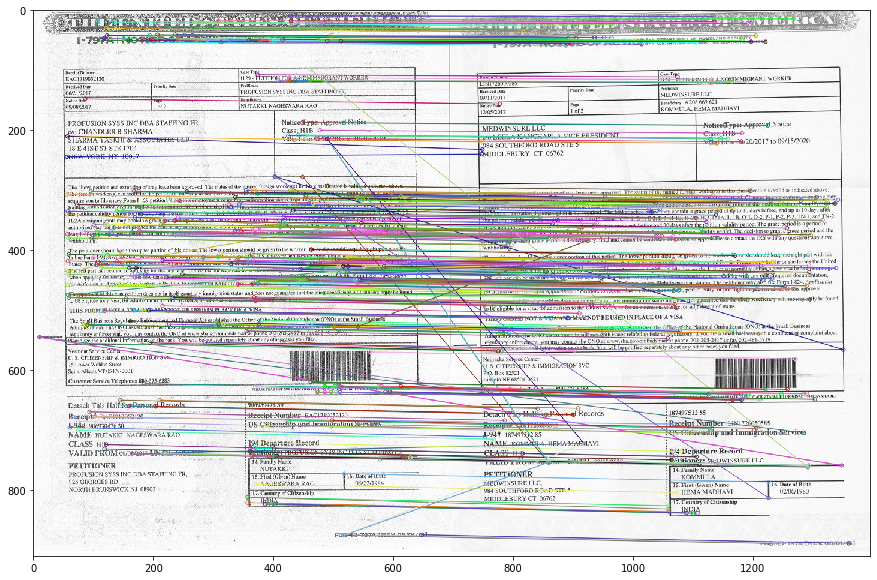

In [85]:
sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
#print(des1, des2)
matches = bf.knnMatch(des1,des2, k=2)


#85
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 87:
        good.append([m])
    if n.distance < 87:
        good.append([n])
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags =2)

im = Image.fromarray(img3)
im.save('FINALWORKINGIMAGEPT2.png')
fig = plt.figure(figsize=(15,15))
plt.imshow(img3)
plt.show()
NUMEBROFMATCHESDISTANCETEST = len(good)

##  Output

In [86]:
print("**************************")
print(IMAGE1NAME)
print(IMAGE2NAME)
print("**************************")
print("IMAGE 1 is FAKE")
print("IMAGE 2 is REAL")
print("**************************")
print("Shape of image 1 is ")
print(x11, " ", y11, " ", z11)
print("Shape of image 2 is")
print(x2, " ", y2, " ", z2)
print("**************************")
print("The SSIM score is ")
if score > 0.25:
    SSIMFINALSCORE = True
else:
    SSIMFINALSCORE = False
print(score)
print("**************************")
print("The Percent Difference is")
print(perdiff)
if perdiff > 0.8:
    PERCENTDIFFERNCE = True
else:
    PERCENTDIFFERNCE = False
print("**************************")
print("The number of key points in image 1 is")
print(NUMBER_OF_KEYPOINST_IMG1)
print("The number of key points in image 2 is")
print(NUMBER_OF_KEYPOINST_IMG2)
print("**************************")
print("The total number of matches is")
print(totalMATCHES)
print("**************************")
print("Number of matches for the distance test is", NUMEBROFMATCHESDISTANCETEST)
print("Number of matches for the ratio test is", NUMEBROFMATCHESRATIOTEST)

**************************
/Users/kunal/Documents/VdartWorking/SampleCopies/FakeCopies/25NOV2019/Nageswara_H1BPNG.PNG
/Users/kunal/Documents/VdartWorking/realFake/Document.jpg
**************************
IMAGE 1 is FAKE
IMAGE 2 is REAL
**************************
Shape of image 1 is 
1735   1341   3
Shape of image 2 is
908   696   3
**************************
The SSIM score is 
0.03599363275978038
**************************
The Percent Difference is
101.96117635945716
**************************
The number of key points in image 1 is
6918
The number of key points in image 2 is
8143
**************************
The total number of matches is
6249
**************************
Number of matches for the distance test is 431
Number of matches for the ratio test is 596


# FINAL OUTPUT

In [87]:
print("BASIC INFO:")
print(IMAGE1NAME)
print(IMAGE2NAME)
print("************************************************************************")
print("Shape of image 1 is ")
print(x11, " ", y11, " ", z11)
print("Shape of image 2 is")
print(x2, " ", y2, " ", z2)
print("************************************************************************")

BASIC INFO:
/Users/kunal/Documents/VdartWorking/SampleCopies/FakeCopies/25NOV2019/Nageswara_H1BPNG.PNG
/Users/kunal/Documents/VdartWorking/realFake/Document.jpg
************************************************************************
Shape of image 1 is 
1735   1341   3
Shape of image 2 is
908   696   3
************************************************************************


In [88]:
#display(Markdown('**some markdown** '))
print("Barcode Output:")
print(BARCODEISCORRECT)
print("************************************************************************")
print("DATE OUTPUT:")
print(DATEWORKING, " because ", WHYDATEISWORKING)
print("************************************************************************")
print("TITLE OUTPUT:")
print(TITLEIMAGECOMPARE)
print("Difference in BLUE       Difference in GREEN     Difference in RED")
print(PERCENT_BLUE_DIFFERENCE_TITLE, "\t\t\t", PERCENT_GREEN_DIFFERENCE_TITLE, "\t\t\t", PERCENT_RED_DIFFERENCE_TITLE)
print("************************************************************************")
print("TEXT OUTPUT:")
print(SIMILARTYBETWEENTEXTINDOCUMENT)
print("************************************************************************")
print("WATER MARK OUTPUT:")
print(WATERMARKOUTPUTFINAL)
print("************************************************************************")
print("SSIM SCORE OUTPUT")
print(SSIMFINALSCORE)
print("************************************************************************")
print("Percent Difference OUTPUT")
print(PERCENTDIFFERNCE)
print("************************************************************************")

Barcode Output:
False
************************************************************************
DATE OUTPUT:
True  because  Year Works
************************************************************************
TITLE OUTPUT:
False
Difference in BLUE       Difference in GREEN     Difference in RED
33.15 			 32.421875 			 28.3625
************************************************************************
TEXT OUTPUT:
False
************************************************************************
WATER MARK OUTPUT:
False
************************************************************************
SSIM SCORE OUTPUT
False
************************************************************************
Percent Difference OUTPUT
True
************************************************************************


In [89]:
countREAL = 0
countFAKE = 0
if BARCODEISCORRECT:
    countREAL += 1
else:
    countFAKE += 1
#------------------------
if DATEWORKING:
    countREAL += 1
else:
    countFAKE += 1
#------------------------
if TITLEIMAGECOMPARE:
    countREAL += 1
else:
    countFAKE += 1
#------------------------
if SIMILARTYBETWEENTEXTINDOCUMENT:
    countREAL += 1
else:
    countFAKE += 1
#------------------------
if WATERMARKOUTPUTFINAL:
    countREAL += 1
else:
    countFAKE += 1
#------------------------
if SSIMFINALSCORE:
    countREAL += 1
else:
    countFAKE += 1
#------------------------
if PERCENTDIFFERNCE:
    countREAL += 1
else:
    countFAKE += 1
print(countREAL, " ", countFAKE)

2   5


In [90]:
documentanswer = False
if countREAL >= 4:
    documentanswer = True

In [91]:
if documentanswer:
    display(Markdown('**Document is REAL**'))
else:
    display(Markdown('**Document is FAKE**'))

**Document is FAKE**